<span class="label label-default" style="background-color:#34568B; border-radius:12px; font-weight: bold; font-family:Comic Sans MS; font-size:36px; color:#FBFAFC; ">Predicting Electricity Prices with Time⏱ Series📈📉 Analysis </span>

<center> <img src="https://cienciadedatos.net/images/forecasting_multi-step_en.gif" width="1300" height="150"> </center>

<font color="#800000" size=+1.5 face="Comic Sans MS"><div style="text-align: justify">Predicting Tomorrow's Energy Prices in Germany: In this Project we predicted the Price(€/MWh) of electricity in Germany with the help of Neural Prophet and fbProphet. Germany's energy market is dynamic and complex, making accurate price forecasting crucial for businesses and consumers alike.</font>

<font color="#0000ff" size=+1.5 face="Comic Sans MS"><div style="text-align: justify">Neural Prophet: This cutting-edge model leverages the power of deep learning to capture intricate patterns and non-linearities within historical energy price data. Its ability to learn complex relationships makes it a strong contender for accurate forecasting.</font>

<font color="Orange" size=+1.5 face="Comic Sans MS"><div style="text-align: justify">fbProphet: Developed by Facebook, this open-source tool offers a robust and interpretable framework for time series forecasting. It excels at capturing seasonality, holidays, and other trends, making it a popular choice for energy price prediction.</font>

<font color="#808000" size=+1.5 face="Comic Sans MS"><div style="text-align: justify">Both models, when trained on historical German energy price data, can generate predictions for tomorrow's €/MWh price. The key lies in evaluating their performance metrics, such as mean squared error (MSE) and mean absolute error (MAE). By comparing these metrics, we can determine which model yields the most accurate forecasts for the German energy market.</font>

<font color="#b8860b" size=+1.5 face="Comic Sans MS"><div style="text-align: justify">fbProphet's interpretability might be advantageous here.Neural Prophet's deep learning nature might require more computational power.How much historical data is needed to train each model effectively?Neural Prophet and fbProphet offer compelling solutions for predicting tomorrow's energy prices in Germany. By carefully assessing their strengths, limitations, and performance metrics in the context of the German market, we can select the most suitable model for our specific needs.</font>

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

import warnings
warnings.filterwarnings("ignore")

In [2]:
sns.set(rc={"axes.facecolor":"Beige" , "axes.grid" : False})

In [3]:
df = pd.read_csv("EU_energy_data.csv")
df.head()

,Unnamed: 0,fecha,hora,sistema,bandera,precio,tipo_moneda,origen_dato,fecha_actualizacion
0,0,2010-07-21,1,HU,1,39.287,1,6,2021-10-01 12:39:53
1,1,2010-07-21,2,HU,1,35.925,1,6,2021-10-01 12:39:53
2,2,2010-07-21,3,HU,1,33.223,1,6,2021-10-01 12:39:53
3,3,2010-07-21,4,HU,1,30.842,1,6,2021-10-01 12:39:53
4,4,2010-07-21,5,HU,1,33.395,1,6,2021-10-01 12:39:53


In [4]:
df = df.rename(columns = {'fecha' : 'Date','hora' : 'Hour' , 'sistema' : 'EU_countries','bandera' : 'Renewable/Non_Renewable',
                         'precio' : 'Cost(€/MWh)','tipo_moneda' : 'CurrencyType','origen_dato' : 'DataSource', 'fecha_actualizacion' : 'Updated_Date'})
df = df.drop('Unnamed: 0',axis=1)

#df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df['Hour'] = df['Hour'].astype(str).str.zfill(2)

try:
  df['Hour'] = pd.to_numeric(df['Hour'])
except:
  # Handle conversion errors (e.g., non-numeric characters)
  print("Error converting 'Hour' column to numeric")

# Function to convert the range
def convert_range(value):
  # Handle edge cases (leading zero and exceeding 24)
  if value == '01':
    return 0
  elif value > 24:
    raise ValueError("Value exceeds 24")
  else:
    # Remove leading zero (assuming strings) or subtract 1 (assuming integers)
    return int(value) - 1 if isinstance(value, int) else int(value[1:])

# Apply the conversion function
df['Hour'] = df['Hour'].apply(convert_range)

# Function to replace values with leading zeros (handles all cases)
def replace_with_leading_zero(value):
  if 0 <= value <= 23:
    return f"{value:02d}"  # Use f-string for consistent formatting
  else:
    raise ValueError(f"Value {value} is outside the range 0-12")

# Apply the function
df['Hour'] = df['Hour'].apply(replace_with_leading_zero)
df['Hour'] = df['Hour'].astype(str)  # Ensure Hour is string type
df['Hour'] = df['Hour'] + ':00:00'

df["Period"] = df[["Date","Hour"]].apply(" ".join, axis=1)

df = df [['Period','EU_countries', 'Renewable/Non_Renewable',
       'Cost(€/MWh)', 'CurrencyType', 'DataSource', 'Updated_Date']]

df['Period'] = pd.to_datetime(df['Period'],format ="%Y-%m-%d %H:%M:%S" )
df.head()

,Period,EU_countries,Renewable/Non_Renewable,Cost(€/MWh),CurrencyType,DataSource,Updated_Date
0,2010-07-21 00:00:00,HU,1,39.287,1,6,2021-10-01 12:39:53
1,2010-07-21 01:00:00,HU,1,35.925,1,6,2021-10-01 12:39:53
2,2010-07-21 02:00:00,HU,1,33.223,1,6,2021-10-01 12:39:53
3,2010-07-21 03:00:00,HU,1,30.842,1,6,2021-10-01 12:39:53
4,2010-07-21 04:00:00,HU,1,33.395,1,6,2021-10-01 12:39:53


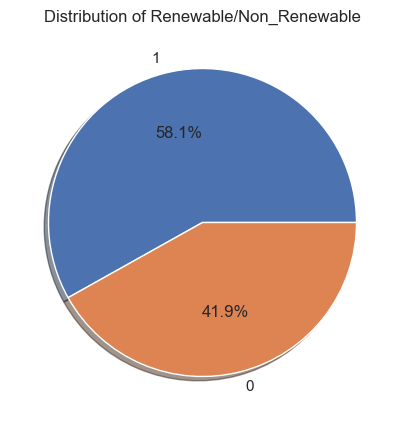

In [5]:
events_1_data = df['Renewable/Non_Renewable'].value_counts()

fig = plt.figure(figsize=(11, 5))
ax = fig.add_subplot()
ax.pie(x=events_1_data.values,
       labels=events_1_data.index,
       shadow=True,
       radius=1,
       autopct='%1.1f%%')
ax.set_title('Distribution of Renewable/Non_Renewable')
plt.show()

In [6]:
eu_countries = df['EU_countries'].unique().tolist()
print(eu_countries)

['HU', 'DK1', 'DK2', 'EE', 'ELE', 'FI', 'GB', 'LT', 'NO1', 'NO2', 'NO3', 'NO4', 'NO5', 'SE1', 'SE2', 'SE3', 'SE4', 'SYS', 'LV', 'ES', 'FR', 'PT', 'FRE', 'RS', 'AT', 'BE', 'DE', 'NL', 'IT', 'CALA', 'CNOR', 'CSUD', 'NORD', 'SARD', 'SICI', 'SUD']


<font color="Brown" size=+2.5 face="Times New Roman"><div style="text-align: justify">Country Code for Europe: https://www.yourdictionary.com/articles/europe-country-codes</font>

<font color="Blue" size=+2 face="Comic Sans MS"><div style="text-align: justify">DE is the Country code for Germany</font>

In [7]:
df['EU_countries'] = df['EU_countries'].replace('DE', 'Germany')
df.head()

,Period,EU_countries,Renewable/Non_Renewable,Cost(€/MWh),CurrencyType,DataSource,Updated_Date
0,2010-07-21 00:00:00,HU,1,39.287,1,6,2021-10-01 12:39:53
1,2010-07-21 01:00:00,HU,1,35.925,1,6,2021-10-01 12:39:53
2,2010-07-21 02:00:00,HU,1,33.223,1,6,2021-10-01 12:39:53
3,2010-07-21 03:00:00,HU,1,30.842,1,6,2021-10-01 12:39:53
4,2010-07-21 04:00:00,HU,1,33.395,1,6,2021-10-01 12:39:53


<font color="Blue" size=+2 face="Comic Sans MS"><div style="text-align: justify">Select Data for Germany</font>

In [8]:
df_Germany = df[df['EU_countries']== "Germany"]
df_Germany.head()

,Period,EU_countries,Renewable/Non_Renewable,Cost(€/MWh),CurrencyType,DataSource,Updated_Date
1223483,2019-07-04 00:00:00,Germany,1,29.93,1,2,2021-10-01 12:39:53
1223509,2019-07-04 01:00:00,Germany,1,28.83,1,2,2021-10-01 12:39:53
1223535,2019-07-04 02:00:00,Germany,1,28.06,1,2,2021-10-01 12:39:53
1223561,2019-07-04 03:00:00,Germany,1,29.06,1,2,2021-10-01 12:39:53
1223587,2019-07-04 04:00:00,Germany,1,29.73,1,2,2021-10-01 12:39:53


In [9]:
# Remove the unnecessary feature
df_Germany = df_Germany.drop(['EU_countries','CurrencyType','DataSource','Updated_Date','Renewable/Non_Renewable'],axis=1)
df_Germany.head().style.set_properties(subset=['Period'], **{'background-color': 'dodgerblue'})

,Period,Cost(€/MWh)
1223483,2019-07-04 00:00:00,29.930000
1223509,2019-07-04 01:00:00,28.830000
1223535,2019-07-04 02:00:00,28.060000
1223561,2019-07-04 03:00:00,29.060000
1223587,2019-07-04 04:00:00,29.730000


In [10]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import acf, pacf

import statsmodels.tsa.api as smt

In [11]:
df_Germany1 = df_Germany.set_index('Period')
df_Germany1.head()

,Cost(€/MWh)
Period,
2019-07-04 00:00:00,29.93
2019-07-04 01:00:00,28.83
2019-07-04 02:00:00,28.06
2019-07-04 03:00:00,29.06
2019-07-04 04:00:00,29.73


Cost(€/MWh)


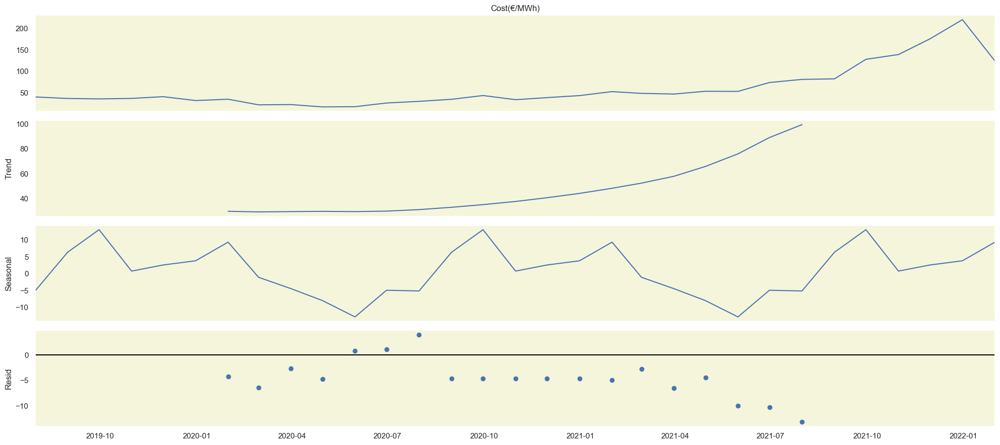

In [12]:
from statsmodels.tsa.seasonal import seasonal_decompose
plt.rcParams["figure.figsize"]=(20,9)

def season_df(data, label):
    df=data.resample("M").mean()
    seasonal_decompose(df['Cost(€/MWh)']).plot()
    print(label)
    return plt.show()

season_df(data=df_Germany1, label="Cost(€/MWh)")

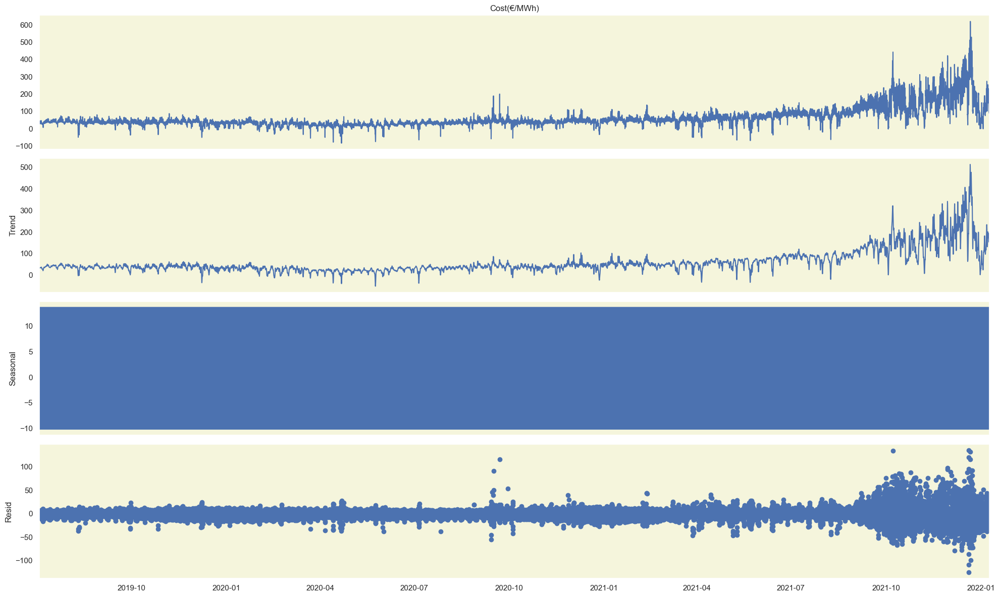

In [13]:
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Set figure size before plotting
plt.rcParams["figure.figsize"] = (20, 12)

dec = sm.tsa.seasonal_decompose(df_Germany1['Cost(€/MWh)'], period=12, model='additive').plot()
plt.show()

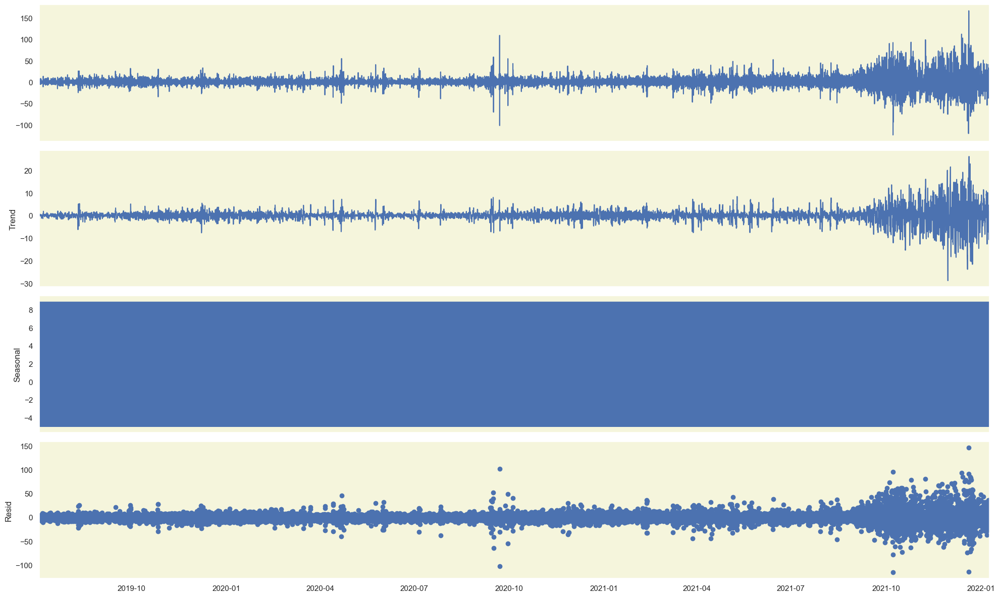

In [14]:
# Set figure size before plotting
plt.rcParams["figure.figsize"] = (20, 12)

from datetime import datetime
data_diff = df_Germany1.diff()
data_diff = data_diff.dropna()

dec = sm.tsa.seasonal_decompose(data_diff,period = 12).plot()
plt.show()

## Stationarity

**In time series analysis, stationarity refers to a property of a series where its statistical properties (like mean, variance, and autocorrelation) are constant over time.  Here's a breakdown of the concept:-**
    
Stationarity plays a vital role in time series analysis. When we grasp this concept, we gain insights into which methods are suitable for our data and how we can enhance forecast accuracy. By converting non-stationary data, we open the door to using a variety of statistical tools for understanding and predicting time series behavior.
    
Imagine you're trying to predict the weather. Stationarity is like having consistent weather patterns. If it's usually sunny in the summer and rainy in the winter, that's a stationary pattern. But if the weather goes crazy, with random heat waves and snowstorms, that's non-stationary.

Many forecasting tools work best with consistent patterns. By smoothing out wild swings in your data (like making the crazy weather more predictable), you can use these tools to make better forecasts for your time series.

![stationarity.png](https://miro.medium.com/v2/resize:fit:1147/1*xdblkZyg6YmmReAkZHUksw.png)


**Intuitive Explanation:**

Imagine a time series like a river flowing at a constant rate. The average water level (mean) stays the same, and the fluctuations around that average (variance) are also consistent throughout the river's course. This is a stationary series.

In contrast, a non-stationary series would be like a river with changing water levels. Maybe it floods seasonally, or dries up over time. The average water level and its variability would change depending on the time of year or long-term trends.


**Formal Definition:**

There are different levels of stationarity, but a basic definition states that a time series is stationary if:

Mean is constant: The average value of the series doesn't have an upward or downward trend over time.
Variance is constant: The spread of the data points around the mean remains consistent throughout the series.
Autocorrelation is constant: The relationship between observations at different time lags (how much past values influence future values) doesn't change over time.

**Why Stationarity Matters:**

Many statistical methods used for time series forecasting and analysis assume stationarity. If a series is non-stationary, these methods might produce unreliable results. Here's why:

Forecasting: Predicting future values becomes difficult if the underlying patterns and relationships in the data are constantly changing.
Statistical Tests: Statistical tests often rely on the assumption of stationarity to ensure their validity.

**Transforming Non-Stationary Data:**

Fortunately, there are techniques to transform non-stationary data into a stationary form. Here are some common methods:

Differencing: Subtracting a previous value from the current value can remove trends.
Detrending: Fitting a trend line and subtracting it from the original series can remove long-term trends.
Seasonal Adjustment: Techniques like seasonal differencing remove seasonal patterns, making the series more stationary.



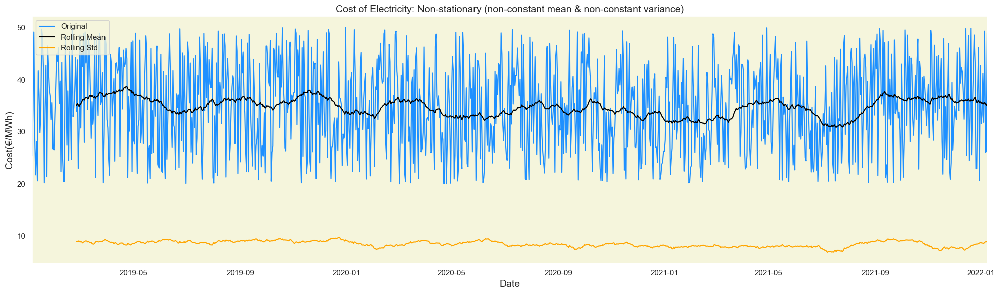

In [15]:
from pandas import Series, date_range
import random

# Sample data (replace with your actual data)
dates = date_range(start='2019-01-04', end='2022-01-08', freq='D')  # Weekly data
costs = [random.uniform(20, 50) for _ in range(len(dates))]  # Random cost values
df_Germany = Series(costs, index=dates, name='Cost(€/MWh)')

# Rolling window (adjust as needed)
rolling_window = 52

# Single plot with multiple lines
fig, ax = plt.subplots(figsize=(20, 6))  # Adjust figure size as needed

sns.lineplot(x=df_Germany.index, y=df_Germany.values, label='Original', ax=ax, color='dodgerblue')
sns.lineplot(x=df_Germany.index, y=df_Germany.rolling(rolling_window).mean(), label='Rolling Mean', ax=ax, color='black')
sns.lineplot(x=df_Germany.index, y=df_Germany.rolling(rolling_window).std(), label='Rolling Std', ax=ax, color='orange')

# Customize plot elements
ax.set_title('Cost of Electricity: Non-stationary (non-constant mean & non-constant variance)', fontsize=14)
ax.set_ylabel('Cost(€/MWh)', fontsize=14)
ax.set_xlabel('Date', fontsize=14)
ax.set_xlim([df_Germany.index[0], df_Germany.index[-1]])  # Set x-axis limits based on data range
ax.legend(loc='upper left')  # Add legend

plt.tight_layout()
plt.show()

we can see that the **Cost(€/MWh) features don't have constant mean and std**.

## <p style="background-color:skyblue; font-family:newtimeroman; font-size:100%; text-align:center">2.3.1 Augmented Dickey-Fuller (ADF)</p>


**Augmented Dickey-Fuller (ADF)** test is a type of statistical test called a unit root test. Unit roots are a cause for non-stationarity.

* **Null Hypothesis (H0)**: Time series has a unit root. (Time series is not stationary).

* **Alternate Hypothesis (H1)**: Time series has no unit root (Time series is stationary).

**If the null hypothesis can be rejected, we can conclude that the time series is stationary.**

There are two ways to rejects the null hypothesis:

On the one hand, the null hypothesis can be rejected if the p-value is below a set significance level. The defaults significance level is 5%

* <font color='red'>**p-value > significance level (default: 0.05)**</font>: Fail to reject the null hypothesis (H0), the data has a unit root and is <font color='red'>non-stationary</font>.
* <font color='green'>**p-value <= significance level (default: 0.05)**</font>: Reject the null hypothesis (H0), the data does not have a unit root and is <font color='green'>stationary</font>.
    
On the other hand, the null hypothesis can be rejects if the test statistic is less than the critical value.
* <font color='red'>**ADF statistic > critical value**</font>: Fail to reject the null hypothesis (H0), the data has a unit root and is <font color='red'>non-stationary</font>.
* <font color='green'>**ADF statistic < critical value**</font>: Reject the null hypothesis (H0), the data does not have a unit root and is <font color='green'>stationary</font>.

In [16]:
from statsmodels.tsa.stattools import adfuller

result = adfuller(df_Germany1['Cost(€/MWh)'].values)
result

(-5.555748632218429,
 1.5824235470756225e-06,
 47,
 22033,
 {'1%': -3.43064683030095,
  '5%': -2.861671189227467,
  '10%': -2.566839828325266},
 151426.87305204582)

In [17]:
df_Germany1.head()

,Cost(€/MWh)
Period,
2019-07-04 00:00:00,29.93
2019-07-04 01:00:00,28.83
2019-07-04 02:00:00,28.06
2019-07-04 03:00:00,29.06
2019-07-04 04:00:00,29.73


In [18]:
df_Germany = df_Germany1.reset_index('Period')
df_Germany = df_Germany.sort_values(ascending=True,by='Period')
df_Germany.head()

,Period,Cost(€/MWh)
0,2019-07-04 00:00:00,29.93
1,2019-07-04 01:00:00,28.83
2,2019-07-04 02:00:00,28.06
3,2019-07-04 03:00:00,29.06
4,2019-07-04 04:00:00,29.73


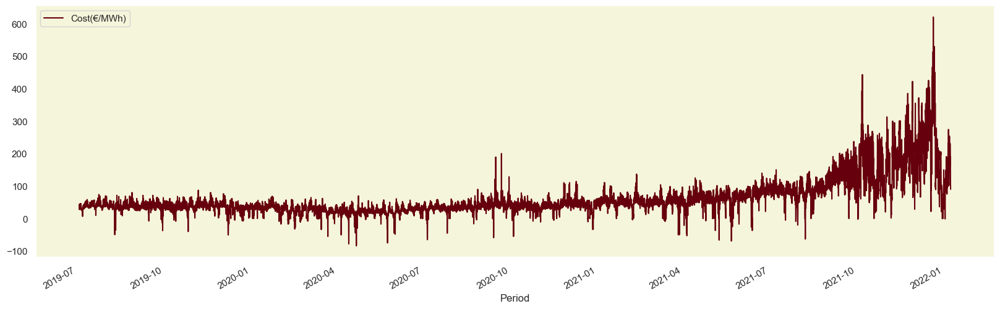

In [19]:
df_Germany.groupby('Period')['Cost(€/MWh)'].agg('sum').plot(legend=True, colormap='Reds_r',figsize = (20, 6));

,y
ds,
2019-07-04,815.58
2019-07-05,846.27


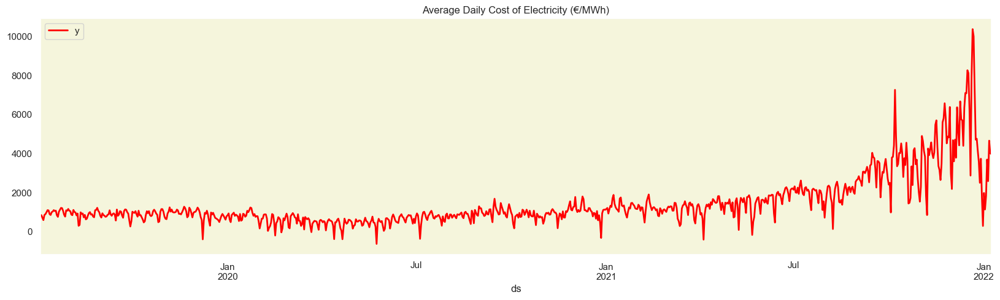

In [20]:
#change to daily frequency
count_date = df_Germany1.groupby(df_Germany1.index.date)['Cost(€/MWh)'].sum()

pw_clean = pd.DataFrame(count_date)
pw_clean['Period'] = pd.to_datetime(pw_clean.index) 
pw_clean = pw_clean.set_index('Period')

pw_clean = pw_clean.reset_index().rename(columns={'Period' : 'ds', 'Cost(€/MWh)'  : 'y'})

pw_clean.set_index('ds',drop=True, inplace=True)
display(pw_clean.head(2))

#plot the data
pw_clean.plot(style='-', figsize=(20, 5), lw=2,
              title='Average Daily Cost of Electricity (€/MWh)',color='Red')

plt.show()

In [21]:
pw_clean.tail()

,y
ds,
2022-01-04,3694.00
2022-01-05,2588.84
2022-01-06,4658.34
2022-01-07,4012.34
2022-01-08,3981.54


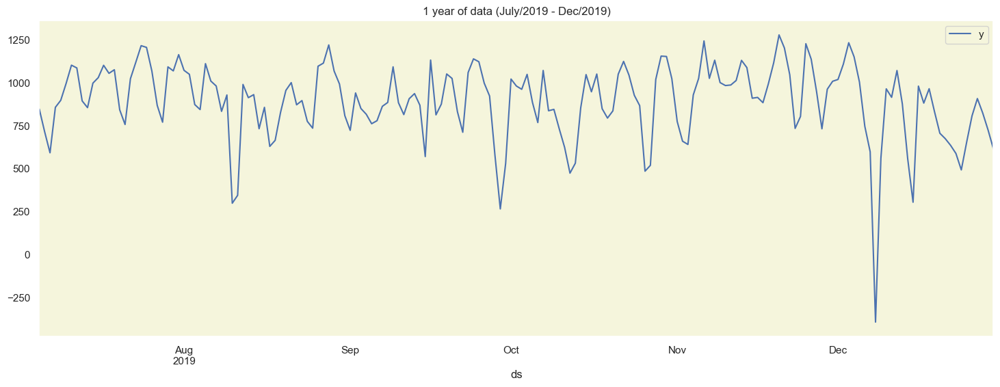

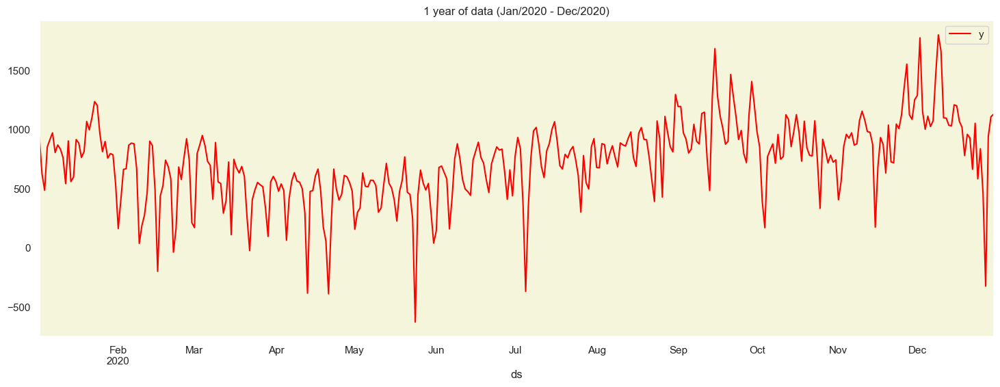

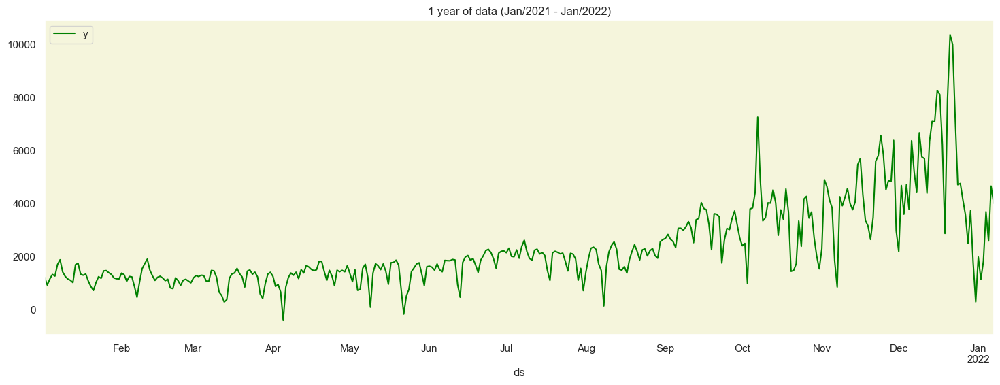

In [22]:
pw_clean.loc[(pw_clean.index > '2019-07-04') & (pw_clean.index < '2019-12-31')] \
    .plot(style='-', figsize=(18, 6), title='1 year of data (July/2019 - Dec/2019)')
plt.show()

pw_clean.loc[(pw_clean.index > '2020-01-01') & (pw_clean.index < '2020-12-31')] \
    .plot(style='-', figsize=(18, 6), title='1 year of data (Jan/2020 - Dec/2020)',color='Red')
plt.show()

pw_clean.loc[(pw_clean.index > '2021-01-01') & (pw_clean.index < '2022-01-08')] \
    .plot(style='-', figsize=(18, 6), title='1 year of data (Jan/2021 - Jan/2022)',color='Green')
plt.show()

## Train Test Split

In [23]:
# Before building and training our model, let's split the data into training and testing
df_train, df_test = df_Germany1[df_Germany1.index < '2021-10-01'], df_Germany1[df_Germany1.index >= '2021-10-01']
print('Train:\t', len(df_train))
print('Test:\t', len(df_test))

Train:	 19680
Test:	 2401


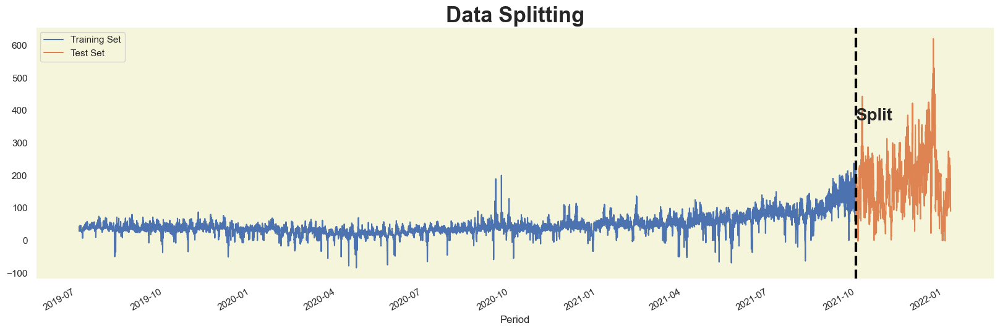

In [24]:
plt.rcParams["figure.figsize"] = (20, 6)

df_train['Cost(€/MWh)'].plot(label='Training Set')
df_test['Cost(€/MWh)'].plot(label='Test Set')
plt.axvline('2021-10-01', color='black', ls='--', lw=3)
plt.text('2021-10-01', 370, 'Split', fontsize=20, fontweight='bold')
plt.title('Data Splitting', weight='bold', fontsize=25)
plt.legend();

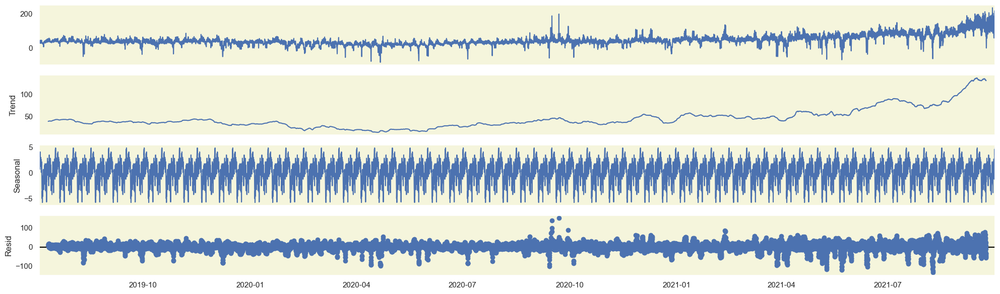

In [25]:
result = seasonal_decompose(df_train, model='additive', period=365)
fig = result.plot()

# FB Prophet Model

In [26]:
def index_to_column(data):
    data = data.reset_index()
    data = data.sort_values('Period')
    data = data.rename(columns={'Period': 'ds', 'Cost(€/MWh)': 'y'})
    return data

In [27]:
prophet_train = index_to_column(df_train)
prophet_test = index_to_column(df_test)

In [61]:
#pip install --upgrade prophet

In [29]:
from prophet import Prophet
prophet_model = Prophet(interval_width=0.95,changepoint_range=0.8,changepoint_prior_scale=0.2,daily_seasonality=True)
prophet_model.fit(prophet_train)
prophet_pred = prophet_model.predict(prophet_test[['ds']]) # Keep the dataset format

12:10:20 - cmdstanpy - INFO - Chain [1] start processing
12:11:08 - cmdstanpy - INFO - Chain [1] done processing


MAE :  68.062


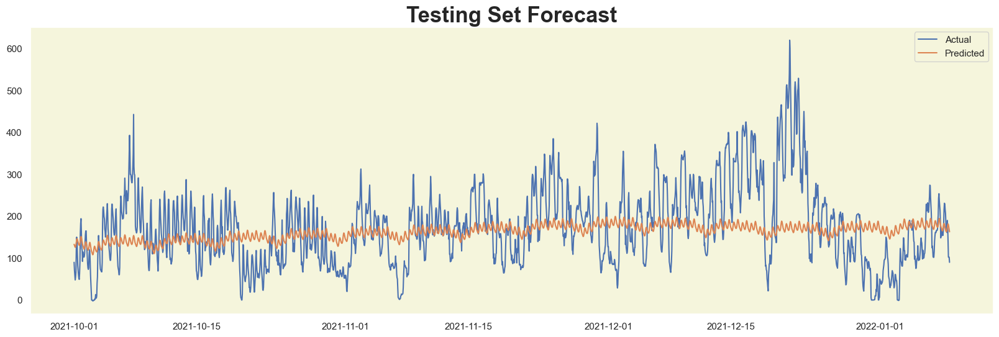

In [30]:
from sklearn.metrics import mean_absolute_error
mae = round(mean_absolute_error(prophet_test['y'], prophet_pred['yhat']), 3)

print("MAE : ",mae )
plt.figure(figsize=(20,6))
plt.plot(prophet_test['ds'], prophet_test['y'], label='Actual')
plt.plot(prophet_pred['ds'], prophet_pred['yhat'], label='Predicted')
plt.title('Test Forecasting', weight='bold', fontsize=40)
#plt.text(16770, 3250, 'MAE: {}'.format(mae), fontsize=20, color='red')
plt.title('Testing Set Forecast', weight='bold', fontsize=25)
plt.legend();

<font color='Brown' size=+1.75 face="Times new roman"> 
    


<font color='Blue'>

> 

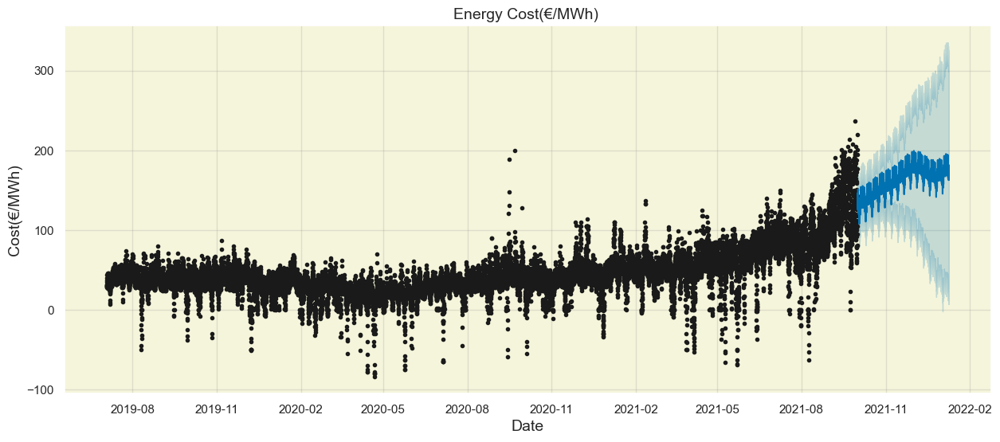

In [31]:
# Plot the day forecast
f, ax = plt.subplots(1)
f.set_figheight(6)
f.set_figwidth(15)

prophet_model.plot(prophet_pred, ax=ax)

ax.set_title('Energy Cost(€/MWh) ', fontsize=14)
ax.set_xlabel(xlabel='Date', fontsize=14)
ax.set_ylabel(ylabel='Cost(€/MWh)', fontsize=14)

plt.show()

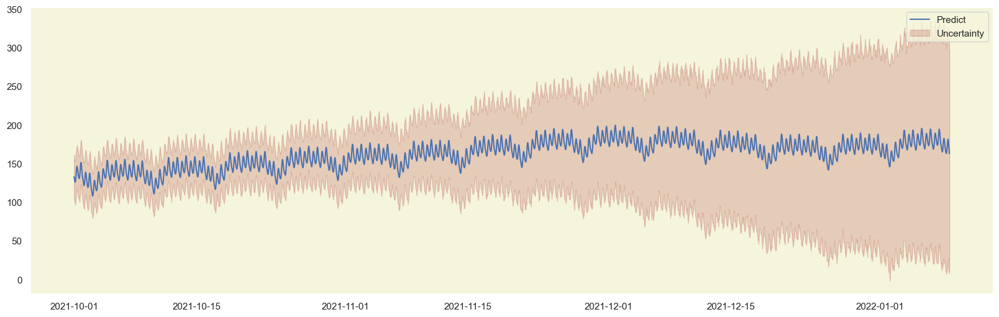

In [32]:
plt.figure(figsize=(20, 6))
plt.plot(prophet_pred['ds'], prophet_pred['yhat'], label='Predict')
plt.fill_between(prophet_pred['ds'], prophet_pred['yhat_lower'], prophet_pred['yhat_upper'], alpha=0.2, color='Brown', label='Uncertainty')
plt.legend()
plt.show()

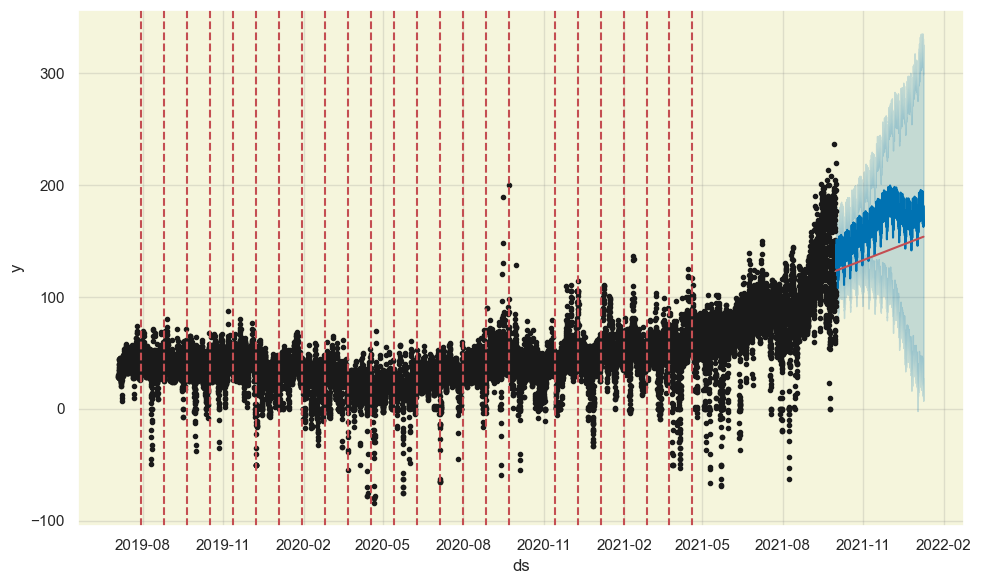

In [33]:
from prophet.plot import plot_plotly, plot_components_plotly, add_changepoints_to_plot
fig1 = prophet_model.plot(prophet_pred)
a = add_changepoints_to_plot(fig1.gca(), prophet_model, prophet_pred)

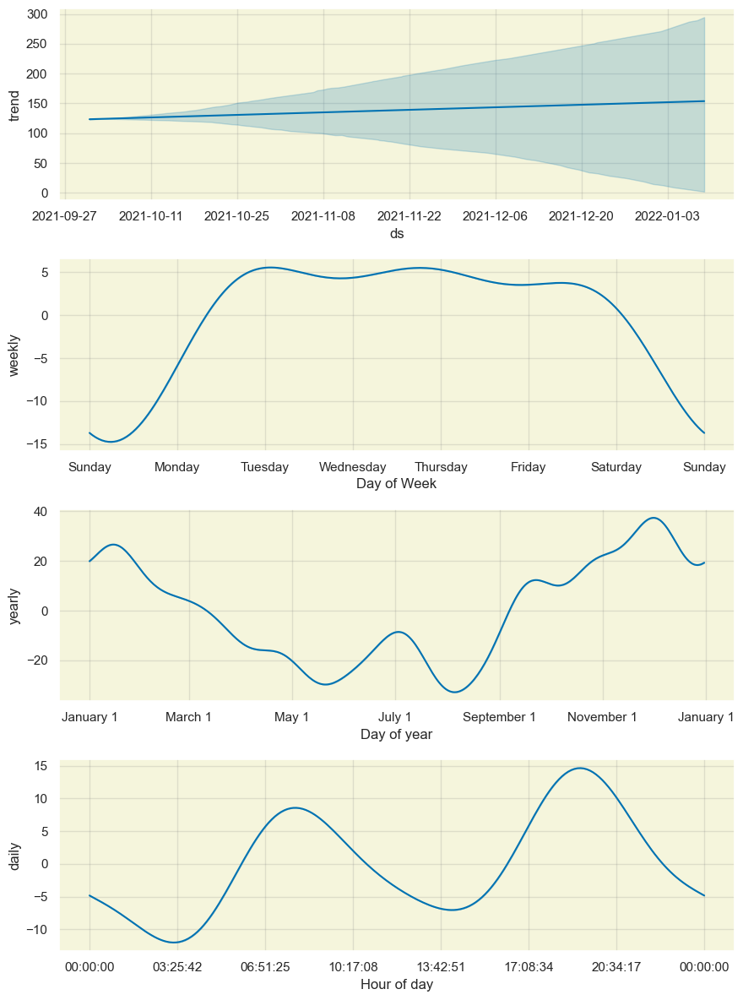

In [34]:
from prophet.plot import plot_plotly, plot_components_plotly
fig = prophet_model.plot_components(prophet_pred)

# Neural Prophet

In [60]:
#!pip install neuralprophet
from neuralprophet import NeuralProphet, set_log_level

set_log_level("ERROR")

In [36]:
#df_Germany2 = df_Germany2.dropna(how='any')

In [37]:
df_Germany.head()

,Period,Cost(€/MWh)
0,2019-07-04 00:00:00,29.93
1,2019-07-04 01:00:00,28.83
2,2019-07-04 02:00:00,28.06
3,2019-07-04 03:00:00,29.06
4,2019-07-04 04:00:00,29.73


In [38]:
df_Germany = df_Germany.rename(columns={'Period' : 'ds', 'Cost(€/MWh)' : 'y'})
df_Germany = df_Germany.drop_duplicates(subset='ds')
df_Germany.head()

,ds,y
0,2019-07-04 00:00:00,29.93
1,2019-07-04 01:00:00,28.83
2,2019-07-04 02:00:00,28.06
3,2019-07-04 03:00:00,29.06
4,2019-07-04 04:00:00,29.73


In [39]:
model = NeuralProphet(
    weekly_seasonality=6,
    daily_seasonality=5,
    trend_reg=1,
    learning_rate=0.01,
)
df_train, df_test = model.split_df(df_Germany, freq="H", valid_p=1.0 / 12)

In [59]:
metrics = model.fit(df_train, freq="H", validation_df=df_test, progress="bar")

In [41]:
pip install -U kaleido

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [42]:
metrics.head()

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
0,337.257446,384.352112,1.593127,0.0,0,281.525818,348.037384,1.047401,0.0
1,121.695671,150.075165,0.492664,0.0,1,157.758911,198.015823,0.524537,0.0
2,87.947922,105.673035,0.323996,0.0,2,63.224144,79.604248,0.157124,0.0
3,75.285721,93.681915,0.262989,0.0,3,22.753162,29.140810,0.029098,0.0
4,77.592987,97.425835,0.271868,0.0,4,13.853541,20.218739,0.014602,0.0


In [43]:
forecast = model.predict(df_train)
model.set_plotting_backend("plotly-static")
model.plot(forecast)

Predicting: 159it [00:00, ?it/s]

Predicting: 159it [00:00, ?it/s]

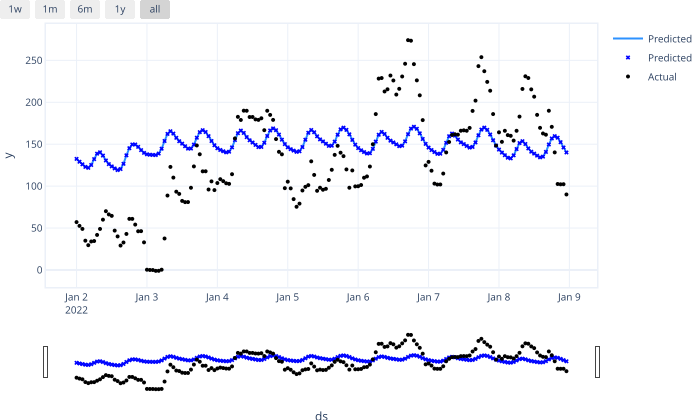

In [44]:
forecast = model.predict(df_test)
model = model.highlight_nth_step_ahead_of_each_forecast(1)
model.plot(forecast[-7 * 24 :])

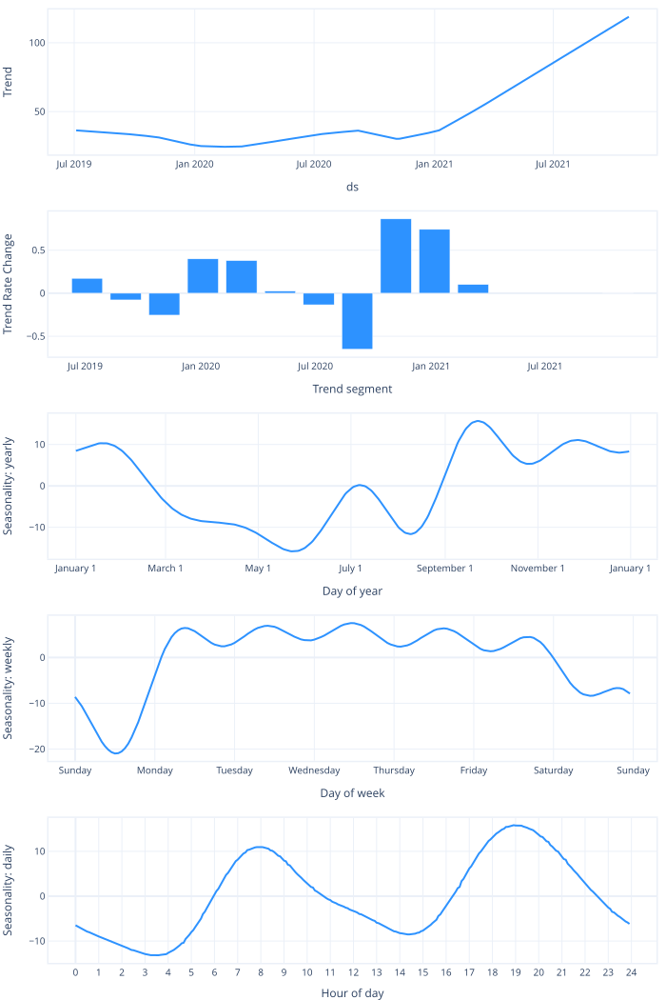

In [45]:
model.plot_parameters()

## 1-step ahead forecast with Auto-Regression

In [46]:
model_AutoRegression = NeuralProphet(
    growth="off",
    yearly_seasonality=False,
    weekly_seasonality=False,
    daily_seasonality=False,
    n_lags=3 * 24,
    ar_reg=1,
    learning_rate=0.01,
)
df_train, df_test = model_AutoRegression.split_df(df_Germany, freq="H", valid_p=1.0 / 12)

In [58]:
metrics = model_AutoRegression.fit(df_train, freq="H", validation_df=df_test, progress="bar")

In [48]:
metrics.head()

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
0,71.554825,92.482132,0.246798,0.0,0,21.990494,32.124058,0.035194,0.0
1,47.411983,61.733932,0.133947,0.0,1,12.659133,18.688164,0.013032,0.0
2,35.281754,46.517765,0.083406,0.0,2,9.349963,13.917518,0.007428,0.0
3,28.767097,38.372482,0.059023,0.0,3,7.731341,11.488861,0.005109,0.0
4,25.232136,33.825741,0.046688,0.0,4,6.640235,9.970233,0.003859,0.0


In [49]:
forecast = model_AutoRegression.predict(df_train)
model_AutoRegression.set_plotting_backend("plotly-static")
model_AutoRegression.plot(forecast)

Predicting: 158it [00:00, ?it/s]

Predicting: 158it [00:00, ?it/s]

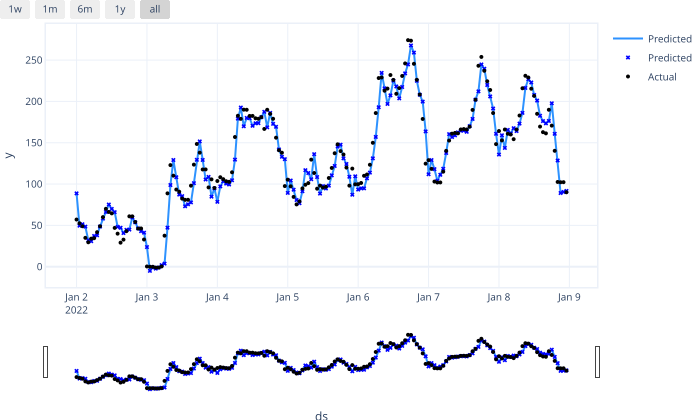

In [50]:
forecast = model_AutoRegression.predict(df_test)
model_AutoRegression = model_AutoRegression.highlight_nth_step_ahead_of_each_forecast(1)
model_AutoRegression.plot(forecast[-7 * 24 :])

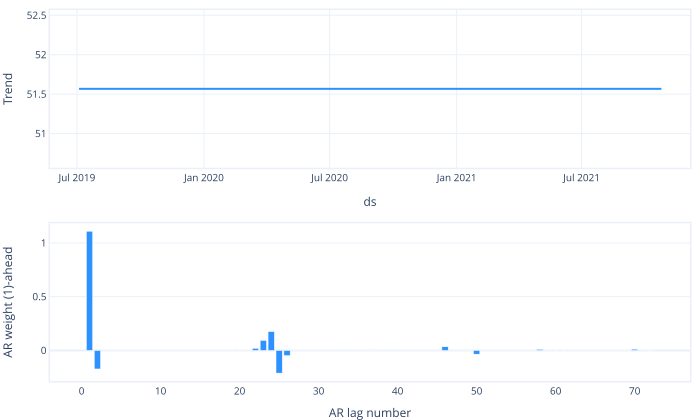

In [51]:
model_AutoRegression.plot_parameters()

## 1 step ahead forecast with AR-Net: Using a Neural Network

In [52]:
model_ARNet = NeuralProphet(
    growth="off",
    yearly_seasonality=False,
    weekly_seasonality=False,
    daily_seasonality=False,
    n_lags=3 * 24,
    ar_layers=[32, 32, 32, 32],
    learning_rate=0.003,
)
df_train, df_test = model_ARNet.split_df(df_Germany, freq="H", valid_p=1.0 / 12)

In [62]:
metrics = model_ARNet.fit(df_train, freq="H", validation_df=df_test, progress="bar")

In [54]:
metrics.head()

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
0,83.878571,111.716835,0.310640,0.0,0,16.865162,23.749630,0.021729,0.0
1,71.442490,95.459305,0.251652,0.0,1,9.864121,15.388891,0.009095,0.0
2,62.134735,83.404900,0.207846,0.0,2,7.719638,12.185970,0.005768,0.0
3,55.629940,74.752541,0.178434,0.0,3,6.767744,10.500876,0.004352,0.0
4,54.784924,75.715073,0.177624,0.0,4,6.213877,9.499994,0.003526,0.0


In [55]:
forecast = model_ARNet.predict(df_train)
model_ARNet.set_plotting_backend("plotly-static")
model_ARNet.plot(forecast)

Predicting: 158it [00:00, ?it/s]

Predicting: 158it [00:00, ?it/s]

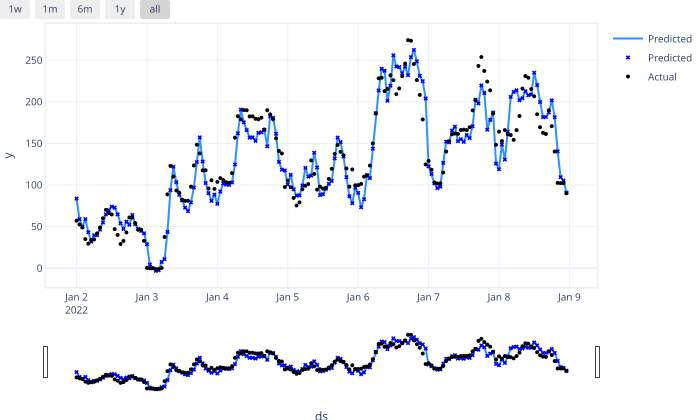

In [63]:
forecast = model_ARNet.predict(df_test)
m = model_ARNet.highlight_nth_step_ahead_of_each_forecast(1)
model_ARNet.plot(forecast[-7 * 24 :])

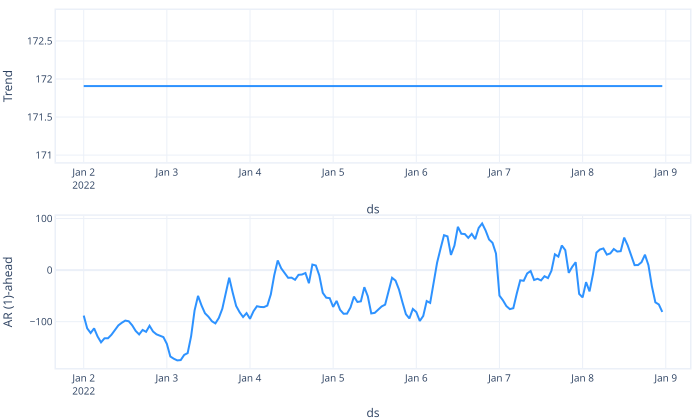

In [64]:
model_ARNet.plot_components(forecast[-7 * 24 :])